# __EDA for Resturants and Cafes and Shops in Riyadh, Saudi Arabia__

## __Contents:__
> 1. Overview
> 2. Installation
> 3. Read datasets
> 4. Explore Information
> 5. Handling Missing Values
> 6. Handling String Values
> 7. Export the cleaned dataset
> 8. Questions & Answers



## __Overview:__

In this project i take dataset from kaggle [here](https://www.kaggle.com/fahd09/riyadh-restaurants-20k)

the cleaned version of this dataset it's on my gitHum [here](https://github.com/rymyf/DS-project-of-restaurants-cafes-in-Riyadh)

Also for more explanation of locations in my dataset i used another dataset wich contains districts. from [gitHub](https://github.com/homaily/Saudi-Arabia-Regions-Cities-and-Districts/tree/master/geojson)

## __Installation:__

In [96]:
# # Install GDAL and Geopandas
# !apt install gdal-bin python-gdal python3-gdal --quiet
# !apt install python3-rtree --quiet
# !pip install git+git://github.com/geopandas/geopandas.git --quiet
# !pip install descartes --quiet
# !pip install geopy
# !pip install plotly_express
# !pip install ipython-autotime

time: 3.15 ms (started: 2021-11-15 12:00:41 +03:00)


In [65]:
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
%load_ext autotime

import geopandas as gpd
import geopy
from geopy.geocoders import Nominatim
from geopy.extra.rate_limiter import RateLimiter
import matplotlib.pyplot as plt
import plotly_express as px
import tqdm
from tqdm import tqdm
from tqdm._tqdm_notebook import tqdm_notebook
%config InlineBackend.figure_format = 'svg'
import seaborn as sns


The autotime extension is already loaded. To reload it, use:
  %reload_ext autotime
time: 38.8 ms (started: 2021-11-15 22:47:32 +03:00)


In [2]:
%reload_ext autotime

time: 541 µs (started: 2021-11-15 21:50:31 +03:00)


## __Read Datasets:__

In [3]:
# 1 - read the handled (from file handling_str_dataset) dataset of riyadh's cafes and resturants 
df = pd.read_excel('handled_dataset.xlsx')

# 2 - convert to Geopandas Geodataframe
gdf_df = gpd.GeoDataFrame(df,geometry=gpd.points_from_xy(df.lng, df.lat))

# 3 - read dataset of districts
districts = gpd.read_file('districts.geojson')

# 4 - Join the GeoDataFrames
df_dis = gdf_df.sjoin(districts, how="inner", predicate='intersects')
df_dis

/Users/RAHAF/opt/anaconda3/lib/python3.8/site-packages/geopandas/geodataframe.py:1938: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  return geopandas.sjoin(left_df=self, right_df=df, *args, **kwargs)


,Unnamed: 0,name,categories,address,lat,lng,price,likes,photos,tips,rating,ratingSignals,geometry,index_right,district_id,city_id,region_id,name_ar,name_en
0,0,مطعم وقت الشواية,Arabic Restaurant,"الرياض 14723, المملكة العربية السعودية",24.518983,46.656981,Moderate,0.0,0,0,NaN,NaN,POINT (46.65698 24.51898),64,10100003065,3,1,حي عكاظ,Okaz Dist.
1,1,ديوانية عكاظ,Cafe,"الرياض 14726, المملكة العربية السعودية",24.518511,46.669149,Cheap,0.0,2,0,NaN,NaN,POINT (46.66915 24.51851),64,10100003065,3,1,حي عكاظ,Okaz Dist.
2,2,شاهي جمر راعي الجمس,Cafe,"الرياض 14726, المملكة العربية السعودية",24.519314,46.670041,Cheap,0.0,0,0,NaN,NaN,POINT (46.67004 24.51931),64,10100003065,3,1,حي عكاظ,Okaz Dist.
3,3,غدير الشام,Arabic Restaurant,المملكة العربية السعودية,24.519520,46.671660,Moderate,0.0,0,0,NaN,NaN,POINT (46.67166 24.51952),64,10100003065,3,1,حي عكاظ,Okaz Dist.
13,13,Starbucks,Cafe,"الرياض 14723, المملكة العربية السعودية",24.522543,46.648867,Cheap,1.0,16,0,8.1,1.0,POINT (46.64887 24.52254),64,10100003065,3,1,حي عكاظ,Okaz Dist.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16858,19338,قهوة العمدة || Alomdah Coffee,Food Truck,المملكة العربية السعودية,24.943424,46.581831,Cheap,1.0,0,0,NaN,NaN,POINT (46.58183 24.94342),146,10100003148,3,1,حي العارض,Al Arid Dist.
16580,19016,الكنيسة,Cafe,"الرياض 13616, المملكة العربية السعودية",24.859723,46.855539,Cheap,0.0,7,0,NaN,NaN,POINT (46.85554 24.85972),181,10100003190,3,1,حي البيان,Al Bayan Dist.
16669,19119,المكان السري,Cafe,"الرياض 13616, المملكة العربية السعودية",24.870172,46.871157,Cheap,0.0,4,0,NaN,NaN,POINT (46.87116 24.87017),181,10100003190,3,1,حي البيان,Al Bayan Dist.
16711,19168,C Store Dammam Riyadh Highway,Fast Food Restaurant,"الرياض, المملكة العربية السعودية",24.875099,46.876825,Cheap,1.0,6,0,NaN,NaN,POINT (46.87683 24.87510),181,10100003190,3,1,حي البيان,Al Bayan Dist.


time: 15.8 s (started: 2021-11-15 21:52:27 +03:00)


## __Explore Information:__

In [4]:
df_dis.info()

<class 'geopandas.geodataframe.GeoDataFrame'>
Int64Index: 16460 entries, 0 to 16786
Data columns (total 19 columns):
 #   Column         Non-Null Count  Dtype   
---  ------         --------------  -----   
 0   Unnamed: 0     16460 non-null  int64   
 1   name           16460 non-null  object  
 2   categories     16460 non-null  object  
 3   address        16460 non-null  object  
 4   lat            16460 non-null  float64 
 5   lng            16460 non-null  float64 
 6   price          16460 non-null  object  
 7   likes          16458 non-null  float64 
 8   photos         16460 non-null  int64   
 9   tips           16460 non-null  int64   
 10  rating         6957 non-null   float64 
 11  ratingSignals  6957 non-null   float64 
 12  geometry       16460 non-null  geometry
 13  index_right    16460 non-null  int64   
 14  district_id    16460 non-null  int64   
 15  city_id        16460 non-null  int64   
 16  region_id      16460 non-null  int64   
 17  name_ar        16460 no

In [5]:
df_dis.describe()

,Unnamed: 0,lat,lng,likes,photos,tips,rating,ratingSignals,index_right,district_id,city_id,region_id
count,16460.000000,16460.000000,16460.000000,16458.000000,16460.000000,16460.000000,6957.000000,6957.000000,16460.000000,1.646000e+04,16460.000000,16460.0
mean,9520.050547,24.720105,46.697413,68.996901,179.821081,18.430255,7.570001,212.653730,89.665735,1.010001e+10,14.237060,1.0
std,5483.521433,0.080308,0.073544,306.927397,1020.517600,79.394674,0.932569,575.347524,53.250813,9.567022e+04,95.679532,0.0
min,0.000000,24.469683,46.272777,0.000000,0.000000,0.000000,4.400000,0.000000,0.000000,1.010000e+10,3.000000,1.0
25%,4808.750000,24.674254,46.643018,0.000000,1.000000,0.000000,6.900000,14.000000,50.000000,1.010000e+10,3.000000,1.0
50%,9529.500000,24.735569,46.692290,3.000000,4.000000,1.000000,7.700000,39.000000,87.000000,1.010000e+10,3.000000,1.0
75%,14246.250000,24.780962,46.754230,19.000000,25.000000,5.000000,8.300000,154.000000,135.000000,1.010000e+10,3.000000,1.0
max,19360.000000,24.943424,46.940912,9984.000000,25811.000000,2301.000000,9.600000,12376.000000,393.000000,1.010099e+10,990.000000,1.0


time: 140 ms (started: 2021-11-15 21:53:02 +03:00)


In [6]:
df_dis.size

312740

time: 10.6 ms (started: 2021-11-15 21:53:05 +03:00)


In [7]:
df_dis.shape

(16460, 19)

time: 2.87 ms (started: 2021-11-15 21:53:06 +03:00)


In [8]:
df_dis.columns

Index(['Unnamed: 0', 'name', 'categories', 'address', 'lat', 'lng', 'price',
       'likes', 'photos', 'tips', 'rating', 'ratingSignals', 'geometry',
       'index_right', 'district_id', 'city_id', 'region_id', 'name_ar',
       'name_en'],
      dtype='object')

time: 4.71 ms (started: 2021-11-15 21:53:08 +03:00)


In [9]:
df_dis.categories.nunique()

23

time: 9.59 ms (started: 2021-11-15 21:53:10 +03:00)


## __Handling Missing Values:__

### Calculate the number of nulls in rating and ratingSignals after dropping:

In [10]:
print("Number of nulls in rating column: ",df_dis.rating.isna().sum())
print("Number of nulls in ratingSignals column: ",df_dis.ratingSignals.isna().sum())

Number of nulls in rating column:  9503
Number of nulls in ratingSignals column:  9503
time: 4.21 ms (started: 2021-11-15 21:53:16 +03:00)


### Filling Missing values in rating and ratingSignals columns:

1. First calculate the sum of rating and ratingSignal for each price type:

In [11]:
rate_med = df_dis.groupby('price')[['rating']].sum()
sign_med = df_dis.groupby('price')[['ratingSignals']].sum()

time: 12.1 ms (started: 2021-11-15 21:53:20 +03:00)


2. Second divide the sum of ratings and ratingSignals by number of rows based on price type:

In [12]:
rate_med['rating']['Cheap'] /= df_dis.shape[0]
rate_med['rating']['Moderate'] /= df_dis.shape[0]
rate_med['rating']['Expensive'] /= df_dis.shape[0]
rate_med['rating']['Very Expensive'] /= df_dis.shape[0]
rate_med

,rating
price,
Cheap,2.528256
Expensive,0.084465
Moderate,0.569095
Very Expensive,0.017728


time: 16.8 ms (started: 2021-11-15 21:53:24 +03:00)


In [13]:
sign_med['ratingSignals']['Cheap'] /= df_dis.shape[0]
sign_med['ratingSignals']['Moderate'] /= df_dis.shape[0]
sign_med['ratingSignals']['Expensive'] /= df_dis.shape[0]
sign_med['ratingSignals']['Very Expensive'] /= df_dis.shape[0]

sign_med

,ratingSignals
price,
Cheap,51.183597
Expensive,13.990279
Moderate,22.867740
Very Expensive,1.838821


time: 11.9 ms (started: 2021-11-15 21:53:27 +03:00)


3. Third Fill null values in rating column based on price type:

In [14]:
# Fill null values in rating column based on price 
df_dis.loc[df_dis.price.str.contains('Cheap')& df_dis.rating.isnull() , 'rating'] = rate_med['rating']['Cheap']
df_dis.loc[df_dis.price.str.contains('Moderate')& df_dis.rating.isnull() , 'rating'] = rate_med['rating']['Moderate']
df_dis.loc[df_dis.price.str.contains('Expensive')& df_dis.rating.isnull() , 'rating'] = rate_med['rating']['Expensive']
df_dis.loc[df_dis.price.str.contains('Very Expensive')& df_dis.rating.isnull() , 'rating'] = rate_med['rating']['Very Expensive']

df_dis.rating.isna().sum()

0

time: 76.2 ms (started: 2021-11-15 21:53:29 +03:00)


3. Fourth Fill null values in ratingSignals column based on price type:

In [15]:
# Fill null values in rating column based on price 
df_dis.loc[df_dis.price.str.contains('Cheap')& df_dis.ratingSignals.isnull() , 'ratingSignals'] = sign_med['ratingSignals']['Cheap']
df_dis.loc[df_dis.price.str.contains('Moderate')& df_dis.ratingSignals.isnull() , 'ratingSignals'] = sign_med['ratingSignals']['Moderate']
df_dis.loc[df_dis.price.str.contains('Expensive')& df_dis.ratingSignals.isnull() , 'ratingSignals'] = sign_med['ratingSignals']['Expensive']
df_dis.loc[df_dis.price.str.contains('Very Expensive')& df_dis.ratingSignals.isnull() , 'ratingSignals'] = sign_med['ratingSignals']['Very Expensive']

df_dis.ratingSignals.isna().sum()

0

time: 77.9 ms (started: 2021-11-15 21:53:33 +03:00)


### Filling Missing values in likes column:

1. First calculate the sum of likes based on price type:

In [16]:
like_med = df_dis.groupby('price')[['likes']].sum() 

time: 6.99 ms (started: 2021-11-15 21:53:39 +03:00)


2. Second divide the sum of likes by number of rows based on price type:

In [17]:
like_med['likes']['Cheap'] /= df_dis.shape[0]
like_med['likes']['Moderate'] /= df_dis.shape[0]
like_med['likes']['Expensive'] /= df_dis.shape[0]
like_med['likes']['Very Expensive'] /= df_dis.shape[0]

like_med

,likes
price,
Cheap,40.136999
Expensive,10.649028
Moderate,16.823937
Very Expensive,1.378554


time: 18.4 ms (started: 2021-11-15 21:53:42 +03:00)


3. Third fill null values in likes column based on price type:

In [18]:
df_dis.loc[df_dis.price.str.contains('Cheap')& df_dis.likes.isnull() , 'likes'] = like_med['likes']['Cheap']
df_dis.loc[df_dis.price.str.contains('Moderate')& df_dis.likes.isnull() , 'likes'] = like_med['likes']['Moderate']
df_dis.loc[df_dis.price.str.contains('Expensive')& df_dis.likes.isnull() , 'likes'] = like_med['likes']['Expensive']
df_dis.loc[df_dis.price.str.contains('Very Expensive')& df_dis.likes.isnull() , 'likes'] = like_med['likes']['Very Expensive']

df_dis.likes.isna().sum()

0

time: 91.3 ms (started: 2021-11-15 21:53:48 +03:00)


### Check for null values in DataFrame:

In [19]:
df_dis.isna().sum()

Unnamed: 0       0
name             0
categories       0
address          0
lat              0
lng              0
price            0
likes            0
photos           0
tips             0
rating           0
ratingSignals    0
geometry         0
index_right      0
district_id      0
city_id          0
region_id        0
name_ar          0
name_en          0
dtype: int64

time: 34.2 ms (started: 2021-11-15 21:53:51 +03:00)


## __Cleaning Dataset__:

### Change column:

In [20]:
df_dis.rename(columns={'Unnamed: 0':'ID'},inplace=True)
df_dis['ID'] = [id for id in range(df_dis.shape[0]) ]

time: 18.1 ms (started: 2021-11-15 21:53:57 +03:00)


In [21]:
df_dis

,ID,name,categories,address,lat,lng,price,likes,photos,tips,rating,ratingSignals,geometry,index_right,district_id,city_id,region_id,name_ar,name_en
0,0,مطعم وقت الشواية,Arabic Restaurant,"الرياض 14723, المملكة العربية السعودية",24.518983,46.656981,Moderate,0.0,0,0,0.569095,22.867740,POINT (46.65698 24.51898),64,10100003065,3,1,حي عكاظ,Okaz Dist.
1,1,ديوانية عكاظ,Cafe,"الرياض 14726, المملكة العربية السعودية",24.518511,46.669149,Cheap,0.0,2,0,2.528256,51.183597,POINT (46.66915 24.51851),64,10100003065,3,1,حي عكاظ,Okaz Dist.
2,2,شاهي جمر راعي الجمس,Cafe,"الرياض 14726, المملكة العربية السعودية",24.519314,46.670041,Cheap,0.0,0,0,2.528256,51.183597,POINT (46.67004 24.51931),64,10100003065,3,1,حي عكاظ,Okaz Dist.
3,3,غدير الشام,Arabic Restaurant,المملكة العربية السعودية,24.519520,46.671660,Moderate,0.0,0,0,0.569095,22.867740,POINT (46.67166 24.51952),64,10100003065,3,1,حي عكاظ,Okaz Dist.
13,4,Starbucks,Cafe,"الرياض 14723, المملكة العربية السعودية",24.522543,46.648867,Cheap,1.0,16,0,8.100000,1.000000,POINT (46.64887 24.52254),64,10100003065,3,1,حي عكاظ,Okaz Dist.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16858,16455,قهوة العمدة || Alomdah Coffee,Food Truck,المملكة العربية السعودية,24.943424,46.581831,Cheap,1.0,0,0,2.528256,51.183597,POINT (46.58183 24.94342),146,10100003148,3,1,حي العارض,Al Arid Dist.
16580,16456,الكنيسة,Cafe,"الرياض 13616, المملكة العربية السعودية",24.859723,46.855539,Cheap,0.0,7,0,2.528256,51.183597,POINT (46.85554 24.85972),181,10100003190,3,1,حي البيان,Al Bayan Dist.
16669,16457,المكان السري,Cafe,"الرياض 13616, المملكة العربية السعودية",24.870172,46.871157,Cheap,0.0,4,0,2.528256,51.183597,POINT (46.87116 24.87017),181,10100003190,3,1,حي البيان,Al Bayan Dist.
16711,16458,C Store Dammam Riyadh Highway,Fast Food Restaurant,"الرياض, المملكة العربية السعودية",24.875099,46.876825,Cheap,1.0,6,0,2.528256,51.183597,POINT (46.87683 24.87510),181,10100003190,3,1,حي البيان,Al Bayan Dist.


time: 125 ms (started: 2021-11-15 21:54:06 +03:00)


### Clear Whitespaces:

In [22]:
# strip whitespaces in columns
df_dis.columns.str.strip()

Index(['ID', 'name', 'categories', 'address', 'lat', 'lng', 'price', 'likes',
       'photos', 'tips', 'rating', 'ratingSignals', 'geometry', 'index_right',
       'district_id', 'city_id', 'region_id', 'name_ar', 'name_en'],
      dtype='object')

time: 17.3 ms (started: 2021-11-15 21:54:27 +03:00)


In [23]:
# strip whitespaces in values of multiple columns
cols = ['name', 'categories', 'price','address','name_en','name_ar']
df_dis[cols] = df_dis[cols].apply(lambda x: x.str.strip())

time: 144 ms (started: 2021-11-15 21:54:30 +03:00)


In [24]:
df_dis

,ID,name,categories,address,lat,lng,price,likes,photos,tips,rating,ratingSignals,geometry,index_right,district_id,city_id,region_id,name_ar,name_en
0,0,مطعم وقت الشواية,Arabic Restaurant,"الرياض 14723, المملكة العربية السعودية",24.518983,46.656981,Moderate,0.0,0,0,0.569095,22.867740,POINT (46.65698 24.51898),64,10100003065,3,1,حي عكاظ,Okaz Dist.
1,1,ديوانية عكاظ,Cafe,"الرياض 14726, المملكة العربية السعودية",24.518511,46.669149,Cheap,0.0,2,0,2.528256,51.183597,POINT (46.66915 24.51851),64,10100003065,3,1,حي عكاظ,Okaz Dist.
2,2,شاهي جمر راعي الجمس,Cafe,"الرياض 14726, المملكة العربية السعودية",24.519314,46.670041,Cheap,0.0,0,0,2.528256,51.183597,POINT (46.67004 24.51931),64,10100003065,3,1,حي عكاظ,Okaz Dist.
3,3,غدير الشام,Arabic Restaurant,المملكة العربية السعودية,24.519520,46.671660,Moderate,0.0,0,0,0.569095,22.867740,POINT (46.67166 24.51952),64,10100003065,3,1,حي عكاظ,Okaz Dist.
13,4,Starbucks,Cafe,"الرياض 14723, المملكة العربية السعودية",24.522543,46.648867,Cheap,1.0,16,0,8.100000,1.000000,POINT (46.64887 24.52254),64,10100003065,3,1,حي عكاظ,Okaz Dist.
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
16858,16455,قهوة العمدة || Alomdah Coffee,Food Truck,المملكة العربية السعودية,24.943424,46.581831,Cheap,1.0,0,0,2.528256,51.183597,POINT (46.58183 24.94342),146,10100003148,3,1,حي العارض,Al Arid Dist.
16580,16456,الكنيسة,Cafe,"الرياض 13616, المملكة العربية السعودية",24.859723,46.855539,Cheap,0.0,7,0,2.528256,51.183597,POINT (46.85554 24.85972),181,10100003190,3,1,حي البيان,Al Bayan Dist.
16669,16457,المكان السري,Cafe,"الرياض 13616, المملكة العربية السعودية",24.870172,46.871157,Cheap,0.0,4,0,2.528256,51.183597,POINT (46.87116 24.87017),181,10100003190,3,1,حي البيان,Al Bayan Dist.
16711,16458,C Store Dammam Riyadh Highway,Fast Food Restaurant,"الرياض, المملكة العربية السعودية",24.875099,46.876825,Cheap,1.0,6,0,2.528256,51.183597,POINT (46.87683 24.87510),181,10100003190,3,1,حي البيان,Al Bayan Dist.


time: 77.4 ms (started: 2021-11-15 21:54:34 +03:00)


## __Export the dataset after clean it:__

In [123]:
# df_dis.to_excel("cleaned_ryd_dist_dataset.xlsx")

time: 8.67 s (started: 2021-11-15 12:00:59 +03:00)


## __Questions & Answers:__

#### 1. Is there a relationship between prices and ratings?

In [25]:
df_dis.price.value_counts()

Cheap             12973
Moderate           3140
Expensive           290
Very Expensive       57
Name: price, dtype: int64

time: 50.1 ms (started: 2021-11-15 21:55:59 +03:00)


In [26]:
# Create new column of type int for price
dic_price = {
        "Cheap":0,
        "Moderate":1,
        "Expensive ":2,
        "Very Expensive":3
}
df['price_encoded'] = df.price.map(dic_price)

time: 9.61 ms (started: 2021-11-15 21:55:59 +03:00)


Mean:
 price
Cheap             60602.305407
Expensive          1399.506725
Moderate          10428.661756
Very Expensive      293.404842
Name: rating, dtype: float64


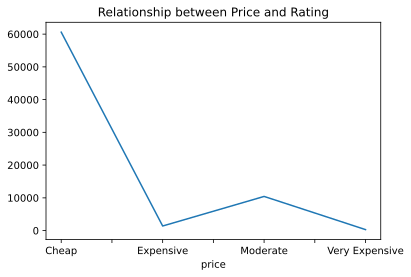

time: 882 ms (started: 2021-11-15 21:55:59 +03:00)


In [27]:
# Answer the question
# df['price_encoded'].corr(df['rating'])
# pri_rat = df[['price_encoded','rating']]
# negatively correlated

# price_norm = (pri_rat['price_encoded']-np.mean(pri_rat['price_encoded']))/np.std(pri_rat['price_encoded'])
# rate_norm = (pri_rat['rating']-np.mean(pri_rat['rating']))/np.std(pri_rat['rating'])
# df.groupby(['price'])['rating'].value_counts()
# df.groupby(['price'])['rating'].median()


pr = df_dis.groupby(['price'])['rating'].sum()

print("Mean:\n",pr)

pr.plot(x='price', y='rating',title="Relationship between Price and Rating");


#### 2. Does everyone who likes the place take a photo of it?

In [28]:
# First way: CALCULATE THE CORR FOR EACH CONDITION
like_photo_corr = df_dis.likes.corr(df_dis.photos)
print('Correlation = ',like_photo_corr)
if like_photo_corr > 0:
    print("They are highly correlated!")
elif like_photo_corr < 0:
    print("They have a low correlation.")
else:
    print("They don't have a relationship.")

like_norm = (df_dis.likes-np.mean(df_dis.likes))/np.std(df_dis.likes)
photo_norm = (df_dis.photos-np.mean(df_dis.photos))/np.std(df_dis.photos)

# Plot correlation values
plt.figure(figsize=[15,5])

plt.subplot(1,2,1)
plt.scatter(like_norm,photo_norm,alpha = 0.2,s=50)
plt.axis([-1, 10, -1, 10]); # [x_min, x_max, y_min, y_max]
plt.xlabel('Normalized Likes')
plt.ylabel('Normalized Photos')

plt.subplot(1,2,2)
plt.plot(like_norm,alpha = 0.5)
plt.plot(photo_norm,alpha = 0.5)
plt.legend(['Normalized Likes','Normalized Photos'])


Correlation =  0.7948700416060449
They are highly correlated!


time: 2.84 s (started: 2021-11-15 21:56:00 +03:00)


#### 3. Does the location affect the prices of the place?

In [31]:
# This code bellow is draft
# df.groupby('OnBitSeq')['KMeans'].apply(lambda x: x.mode().iloc[0])
# gb_dis = df_dis.groupby(['name_en','district_id'], as_index=False)[['price']].apply(lambda x: x.mode().iloc[0])
# gb_dis

# Groupby district, then count rows for each price !
gb_dis = df_dis.groupby(['name_en', 'price'])[['ID']].count().sort_values(ascending=False ,by='ID')
gb_dis = gb_dis.reset_index()
gb_dis= gb_dis.set_index('name_en')
gb_dis.head(20)

,price,ID
name_en,,
Hitteen Dist.,Cheap,409
Al Malqa Dist.,Cheap,397
Al Olaya Dist.,Cheap,299
Dhahrat Laban Dist.,Cheap,282
Al Rabwah Dist.,Cheap,277
Al Yasmeen Dist.,Cheap,271
Al Aqeeq Dist.,Cheap,265
Qurtubah Dist.,Cheap,249
Al Rawdah Dist.,Cheap,246


time: 44.5 ms (started: 2021-11-15 21:58:17 +03:00)


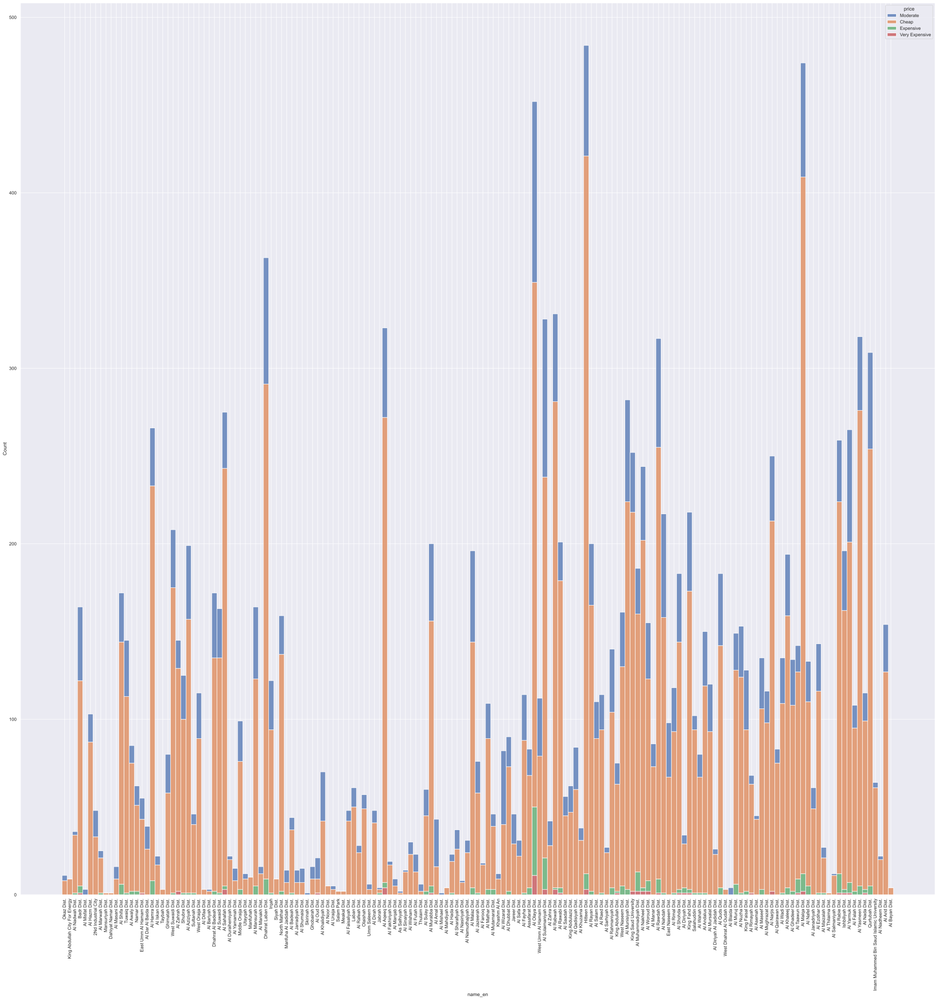

time: 16.8 s (started: 2021-11-15 23:51:05 +03:00)


In [87]:
# sns.barplot(x ='price' ,y='district_id',data=gb_dis);

# viz
# sns.set(style="dark")
# g = sns.catplot(x='name_en',
#                 y= 'ID',
#                 hue='price',
#                 data=gb_dis,
#                 kind='bar',
#                 ci=None,height=6
#                    );
# g.set_axis_labels("Districts", "Count")

# order=['Cheap','Moderate','Expensive', 'Very Expensive']
# sample = gb_dis.sample()

plt.figure(figsize=(40, 40))
sns.set_theme(style="darkgrid")
ax = sns.histplot(data=df_dis,x="name_en",hue='price',multiple='stack',binwidth=2);
plt.xticks(rotation='vertical');

# sns.catplot(x="name_en", y= df_dis.price , hue="price", data=df_dis);
# sns.countplot(x="name_en", hue="price", data=df_dis);

# chart = sns.barplot(x= sample.name_en, y=sample.ID, palette=sns.color_palette("BuGn_r") )
# chart.set_xticklabels(chart.get_xticklabels(), rotation=90, horizontalalignment='right')

# plt.tight_layout()

In [33]:
# plt.figure(figsize=[20,5])
# # plt.bar(gb_dis.index, gb_dis.price, width=10)
# # ax.set_xticklabels(ax.get_xticklabels(), rotation= 90, ha="right");
# # plt.tight_layout()
# # plt.show()

# # gb_dis.plot.bar(stacked=True)


<Figure size 1440x360 with 0 Axes>

<Figure size 1440x360 with 0 Axes>

time: 9.09 ms (started: 2021-11-15 21:58:34 +03:00)


#### 4. What are the most common areas where cafes and restaurants are located?

In [35]:
fig, ax = plt.subplots(figsize=(10,10))
ryd_map = districts[ districts.city_id == 3 ]
ryd_map.plot(color="Gray", ax= ax);
df_dis.plot(ax=ax)

<AxesSubplot:>

time: 2.61 s (started: 2021-11-15 21:58:34 +03:00)


In [36]:
fig, ax = plt.subplots(figsize=(10,10))
ryd_map.plot(color="Gray", ax= ax);
df_dis.plot(ax=ax, markersize=3)
# ryd_map = districts[ districts.city_id == 3 ]
# ryd_map.plot(color="Gray", ax= ax);
# top5_area.plot(ax=ax)

<AxesSubplot:>

time: 3.02 s (started: 2021-11-15 21:58:38 +03:00)


In [37]:
ryd_map.crs == gdf_df.crs

False

time: 5.3 ms (started: 2021-11-15 21:58:41 +03:00)


In [38]:
sjoined_df = gpd.sjoin(gdf_df, ryd_map , op="within")
sjoined_df.head()

/Users/RAHAF/opt/anaconda3/lib/python3.8/site-packages/IPython/core/interactiveshell.py:3357: FutureWarning: The `op` parameter is deprecated and will be removed in a future release. Please use the `predicate` parameter instead.
  if (await self.run_code(code, result,  async_=asy)):
<ipython-input-38-d3e1f2c4eb43>:1: UserWarning: CRS mismatch between the CRS of left geometries and the CRS of right geometries.
Use `to_crs()` to reproject one of the input geometries to match the CRS of the other.

Left CRS: None
Right CRS: EPSG:4326

  sjoined_df = gpd.sjoin(gdf_df, ryd_map , op="within")


,Unnamed: 0,name,categories,address,lat,lng,price,likes,photos,tips,rating,ratingSignals,geometry,price_encoded,index_right,district_id,city_id,region_id,name_ar,name_en
0,0,مطعم وقت الشواية,Arabic Restaurant,"الرياض 14723, المملكة العربية السعودية",24.518983,46.656981,Moderate,0.0,0,0,NaN,NaN,POINT (46.65698 24.51898),1.0,64,10100003065,3,1,حي عكاظ,Okaz Dist.
1,1,ديوانية عكاظ,Cafe,"الرياض 14726, المملكة العربية السعودية",24.518511,46.669149,Cheap,0.0,2,0,NaN,NaN,POINT (46.66915 24.51851),0.0,64,10100003065,3,1,حي عكاظ,Okaz Dist.
2,2,شاهي جمر راعي الجمس,Cafe,"الرياض 14726, المملكة العربية السعودية",24.519314,46.670041,Cheap,0.0,0,0,NaN,NaN,POINT (46.67004 24.51931),0.0,64,10100003065,3,1,حي عكاظ,Okaz Dist.
3,3,غدير الشام,Arabic Restaurant,المملكة العربية السعودية,24.519520,46.671660,Moderate,0.0,0,0,NaN,NaN,POINT (46.67166 24.51952),1.0,64,10100003065,3,1,حي عكاظ,Okaz Dist.
13,13,Starbucks,Cafe,"الرياض 14723, المملكة العربية السعودية",24.522543,46.648867,Cheap,1.0,16,0,8.1,1.0,POINT (46.64887 24.52254),0.0,64,10100003065,3,1,حي عكاظ,Okaz Dist.


time: 919 ms (started: 2021-11-15 21:58:42 +03:00)


In [39]:
# Groupby dist, then calculate the mode for price !
# common_areas = df_dis.groupby(["name_en",'district_id'], as_index=False)[['name_en']].count().sort_values(ascending= False, by='name_en')
# common_areas.head()

grouped = sjoined_df.groupby("district_id").size()
common_areas = grouped.to_frame().reset_index()
common_areas.columns = ['district_id', 'places_count']
common_areas = common_areas.sort_values(ascending= False, by='places_count')
common_areas.head()

# grouped = df_dis.groupby('name_en')
# grouped = df_dis.groupby("name_en").size()
# common_areas = grouped.to_frame().reset_index()
# common_areas.columns = ['name_en', 'places_count']
# common_areas = common_areas.sort_values(ascending= False, by='places_count')
# common_areas

# common_areas = grouped.to_frames.size()
# common_areas.columns = ['name_en','lat','lng','geometry', 'places_count']

# top5_area = common_areas.head()

,district_id,places_count
136,10100003144,484
137,10100003145,474
72,10100003075,452
135,10100003143,363
46,10100003047,331


time: 20.7 ms (started: 2021-11-15 21:58:43 +03:00)


In [40]:
merged_areas = ryd_map.merge(common_areas, on='district_id', how='outer')
merged_areas.head(60)
# ryd_map

,district_id,city_id,region_id,name_ar,name_en,geometry,places_count
0,10100003001,3,1,حي العمل,Al Amal Dist.,"POLYGON ((46.72488 24.64900, 46.71615 24.65122...",43.0
1,10100003002,3,1,حي النموذجية,Al Namudhajiyah Dist.,"POLYGON ((46.70228 24.65018, 46.70169 24.65439...",31.0
2,10100003003,3,1,حي الجرادية,Al Jarradiyah Dist.,"POLYGON ((46.70655 24.61729, 46.70110 24.61799...",14.0
3,10100003004,3,1,حي الصناعية,Al Sinaiyah Dist.,"POLYGON ((46.76000 24.64062, 46.75861 24.64535...",14.0
4,10100003005,3,1,حي منفوحة الجديدة,Manfuha Al Jadidah Dist.,"POLYGON ((46.72719 24.61343, 46.72651 24.61507...",14.0
5,10100003006,3,1,حي الفاخرية,Al Fakhiriyah Dist.,"POLYGON ((46.69323 24.64695, 46.69320 24.64696...",19.0
6,10100003007,3,1,حي الديرة,Al Dirah Dist.,"POLYGON ((46.71493 24.63826, 46.71485 24.63827...",48.0
7,10100003008,3,1,حي ام الحمام الشرقي,East Umm Al Hamam Dist.,"POLYGON ((46.65536 24.70189, 46.65518 24.70190...",55.0
8,10100003009,3,1,حي الشرفية,Al Sharafiyah Dist.,"POLYGON ((46.66279 24.66857, 46.66250 24.66882...",37.0
9,10100003010,3,1,حي الهدا,Al Hada Dist.,"POLYGON ((46.65254 24.67553, 46.64883 24.67800...",23.0


time: 62 ms (started: 2021-11-15 21:58:43 +03:00)


In [41]:
merged_areas.shape[0] == common_areas.shape[0]

False

time: 4.75 ms (started: 2021-11-15 21:58:43 +03:00)


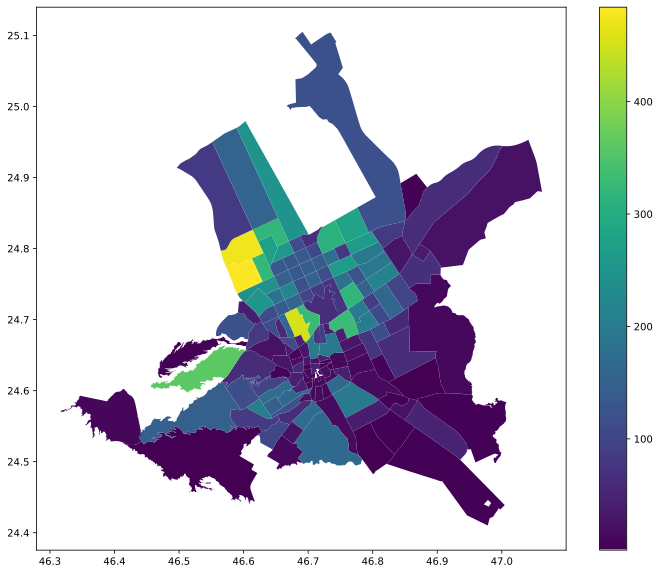

time: 513 ms (started: 2021-11-15 21:58:43 +03:00)


In [42]:
merged_areas.plot(column="places_count", cmap='viridis', legend=True, figsize=(12,10));

In [43]:
# locator = Nominatim(user_agent="myGeocoder")
# coordinates = “53.480837, -2.244914”
# location = locator.reverse(coordinates)
# location.raw

time: 356 µs (started: 2021-11-15 21:58:43 +03:00)


#### 5. What is the ratio of restaurants, cafes and shops?

7923
4885
3320
751


ValueError: shape mismatch: objects cannot be broadcast to a single shape

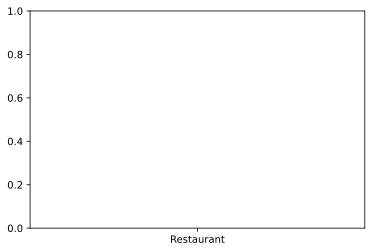

time: 208 ms (started: 2021-11-15 21:58:43 +03:00)


In [44]:
n_rest = df.categories.str.contains('Restaurant').sum()
n_cafe = df.categories.str.contains('Cafe').sum()
n_shop = df.categories.str.contains('Shop').sum()
n_truck = df.categories.str.contains('Truck').sum()

print(n_rest)
print(n_cafe)
print(n_shop)
print(n_truck)


# plt.pie([n_rest,n_cafe],labels=['Restaurant','Cafe'])
plt.bar(['Restaurant','Cafe','Shop','Truck'],[n_rest,n_cafe,n_shop],color=['g','r','b'])

#### 6. What are people's preferences for the type of categories?

521571.0
464912.0
153806.0
7759.0


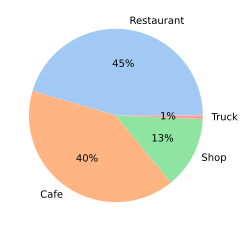

time: 295 ms (started: 2021-11-15 12:49:52 +03:00)


In [ ]:

n_rest = df [df.categories.str.contains('Restaurant')]['likes'].sum()
n_cafe = df[ df.categories.str.contains('Cafe')]['likes'].sum()
n_shop = df[ df.categories.str.contains('Shop')]['likes'].sum()
n_truck = df[ df.categories.str.contains('Truck')]['likes'].sum()


print(n_rest)
print(n_cafe)
print(n_shop)
print(n_truck)
clor = sns.color_palette('pastel')
plt.pie([n_rest,n_cafe,n_shop,n_truck],labels=['Restaurant','Cafe','Shop','Truck'], colors=clor , autopct='%.0f%%' );

#### 7. What is the most liked type of restaurant?

In [ ]:
# First get all resturants with their likes
rest = df[df.categories.str.contains('Restaurant')][['categories','likes']]

# Second group by the type of resturants and sum their likes then sort in descinding order
top_lik = (rest.groupby(['categories'], as_index=False))[['likes']].sum().sort_values(ascending=False,by='likes')

# Third print the top 5 types of returants the people liked
top_lik.head()


,categories,likes
6,Fast Food Restaurant,165355.0
2,Arabic Restaurant,61960.0
13,Sandwich Restaurant,57286.0
10,Italian Restaurant,52378.0
5,European Restaurant,30738.0


time: 66.8 ms (started: 2021-11-15 12:43:19 +03:00)


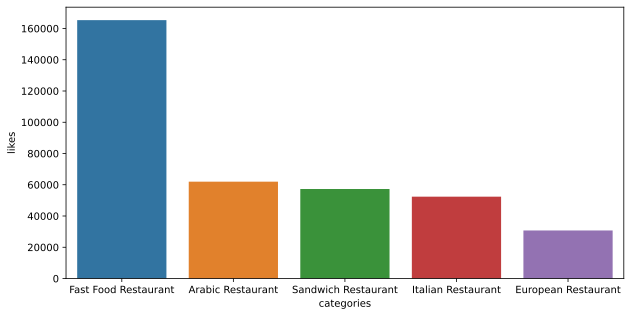

time: 418 ms (started: 2021-11-15 12:43:23 +03:00)


In [ ]:
# Plot values
plt.figure(figsize=[10,5])
c =['blue', 'purple','red', 'green', 'orange']
# plt.bar( top_lik.categories.head(), top_lik.likes.head() , color=c)
sns.barplot(x='categories',y='likes' ,data=top_lik.head());